In [1]:
pip install -U tensorflow tensorflow_docs imageio opencv-python-headless matplotlib pandas


  Obtaining dependency information for opencv-python-headless from https://files.pythonhosted.org/packages/26/d0/22f68eb23eea053a31655960f133c0be9726c6a881547e6e9e7e2a946c4f/opencv_python_headless-4.10.0.84-cp37-abi3-win_amd64.whl.metadata
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.8 MB 145.2 kB/s eta 0:04:27
   ---------------------------------------- 0.0/38.8 MB 163.4 kB/s eta 0:03:57
   ---------------------------------------- 0.0/38.8 MB 163.4 kB/s eta 0:03:57
   ---------------------------------------- 0.0/38.8 MB 163.4 kB/s eta 0:03:57
   ---------------------------------------- 0.1/38.8 MB 148.8 kB/s eta 0:04:20
   ------------

ERROR: THESE PACKAGES DO NOT MATCH THE HASHES FROM THE REQUIREMENTS FILE. If you have updated the package versions, please update the hashes. Otherwise, examine the package contents carefully; someone may have tampered with them.
    unknown package:
        Expected sha256 afcf28bd1209dd58810d33defb622b325d3cbe49dcd7a43a902982c33e5fad05
             Got        e09e633f3ef068dabead2e94b0ae979a59be9aca663b52dfdb31e6750afdb93f


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
from tensorflow_docs.vis import embed
from tensorflow import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os
from IPython.display import HTML
from base64 import b64encode


In [3]:


# Update the train and test sample folder paths
TRAIN_SAMPLE_FOLDER = r"C:\Users\saipr\Downloads\deepfake-detection-challenge\train_sample_videos"
TEST_FOLDER = r"C:\Users\saipr\Downloads\deepfake-detection-challenge\test_videos"

# Load train and test samples
train_samples = os.listdir(TRAIN_SAMPLE_FOLDER)
test_samples = os.listdir(TEST_FOLDER)

# Display the number of train and test samples
print(f"Train samples: {len(train_samples)}")
print(f"Test samples: {len(test_samples)}")

# Load metadata for train samples
train_sample_metadata = pd.read_json(os.path.join(TRAIN_SAMPLE_FOLDER, 'metadata.json')).T
train_sample_metadata.head()

# Load test videos metadata
test_videos = pd.DataFrame(test_samples, columns=['video'])
test_videos.head()


Train samples: 401
Test samples: 400


,video
0,aassnaulhq.mp4
1,aayfryxljh.mp4
2,acazlolrpz.mp4
3,adohdulfwb.mp4
4,ahjnxtiamx.mp4


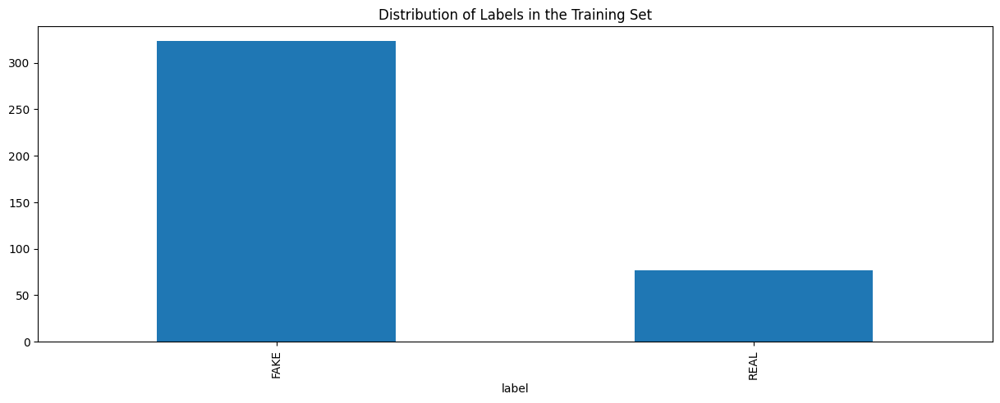

(400, 3)

In [4]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()
train_sample_metadata.shape


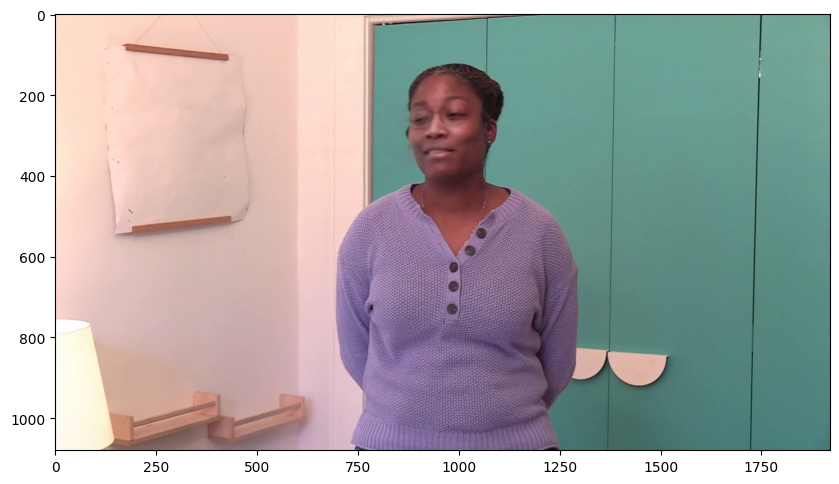

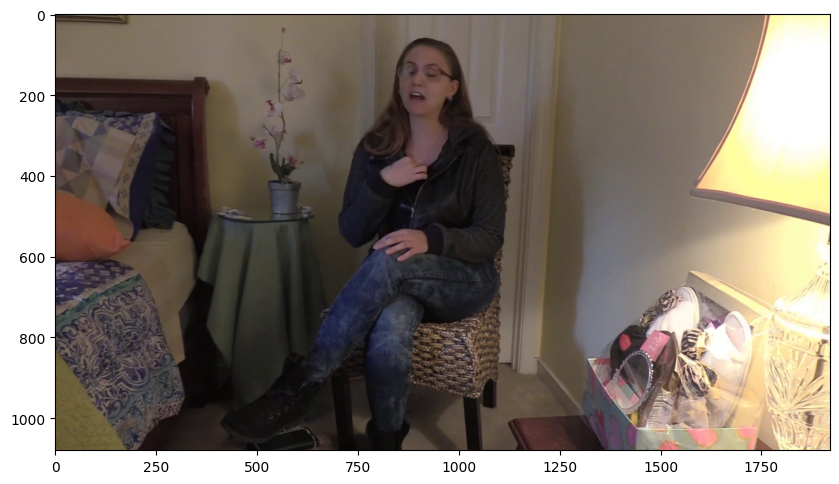

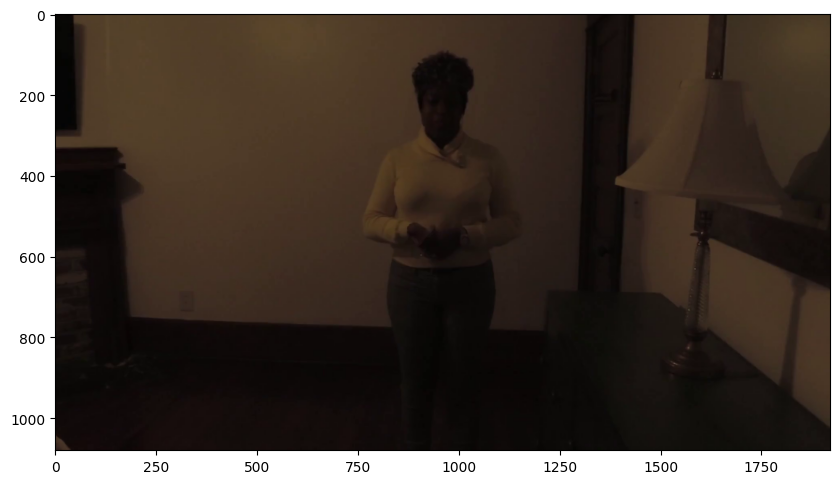

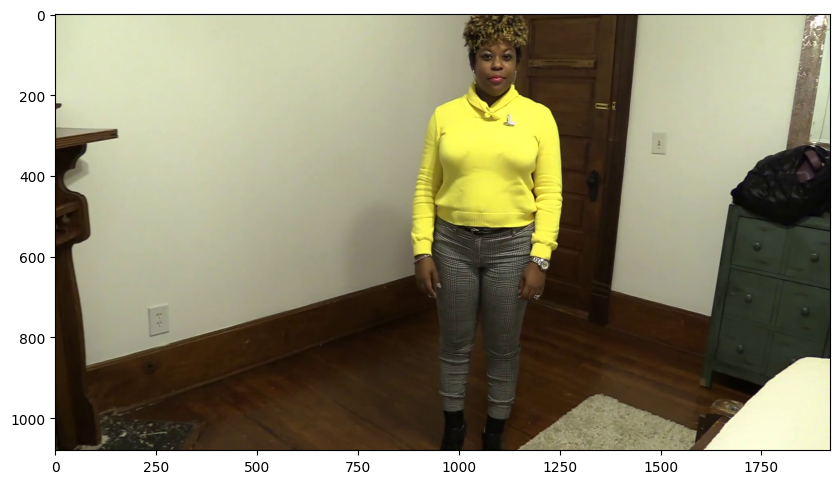

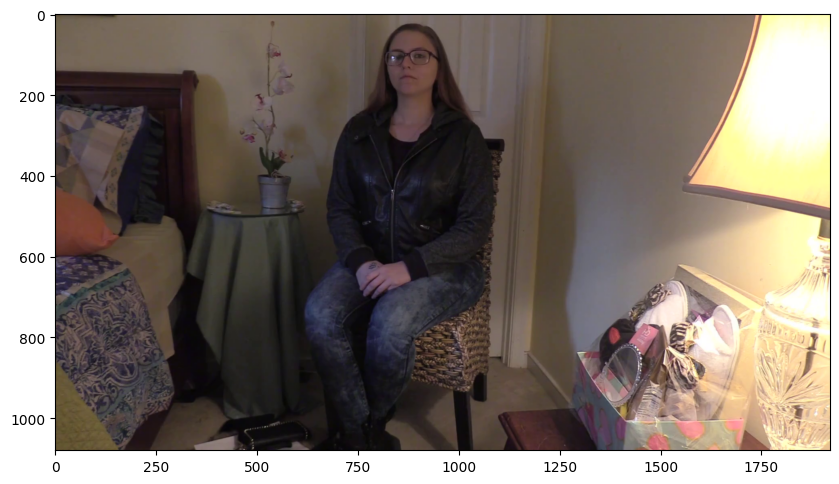

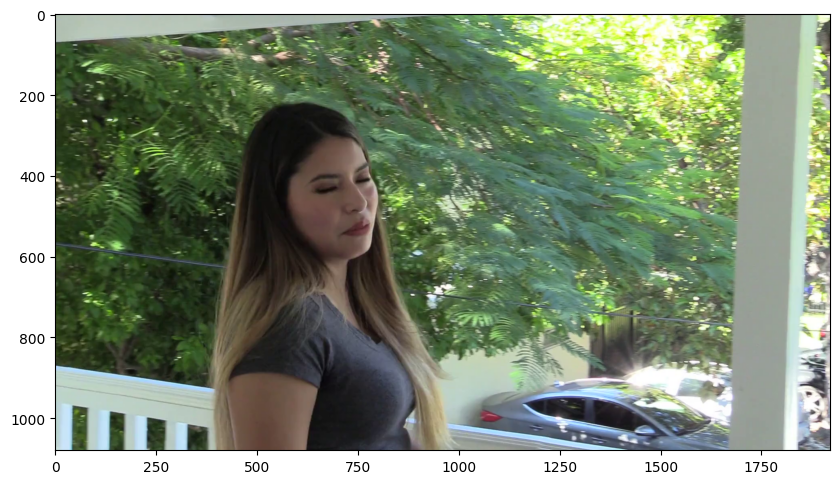

In [6]:
DATA_FOLDER = r"C:\Users\saipr\Downloads\deepfake-detection-challenge"
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(3).index)
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(3).index)

def display_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)
    capture_image.release()

for video_file in fake_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

for video_file in real_train_sample_video:
    display_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))


<Figure size 640x480 with 0 Axes>

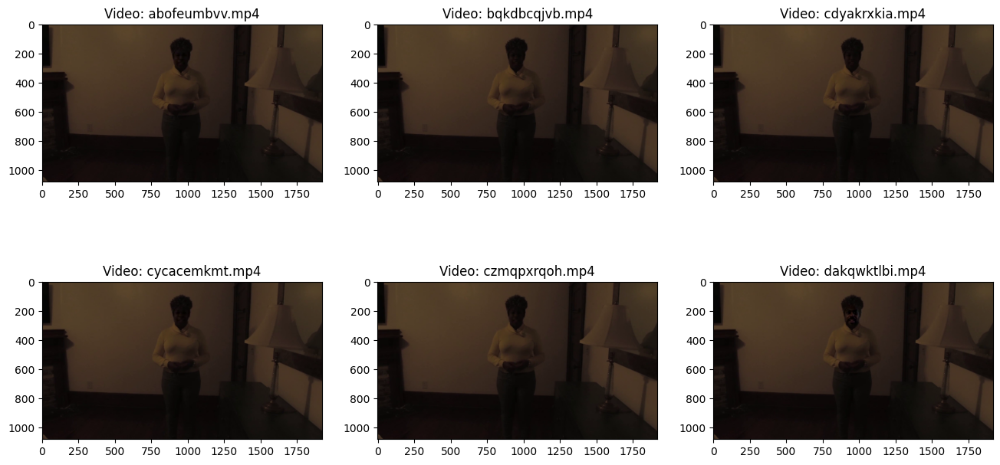

In [7]:
def display_image_from_video_list(video_path_list, video_folder=TRAIN_SAMPLE_FOLDER):
    plt.figure()
    fig, ax = plt.subplots(2,3,figsize=(16,8))
    for i, video_file in enumerate(video_path_list[0:6]):
        video_path = os.path.join(DATA_FOLDER, video_folder, video_file)
        capture_image = cv2.VideoCapture(video_path)
        ret, frame = capture_image.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        ax[i//3, i%3].imshow(frame)
        ax[i//3, i%3].set_title(f"Video: {video_file}")
        ax[i//3, i%3].axis('on')
        capture_image.release()

same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='atvmxvwyns.mp4'].index)
display_image_from_video_list(same_original_fake_train_sample_video)


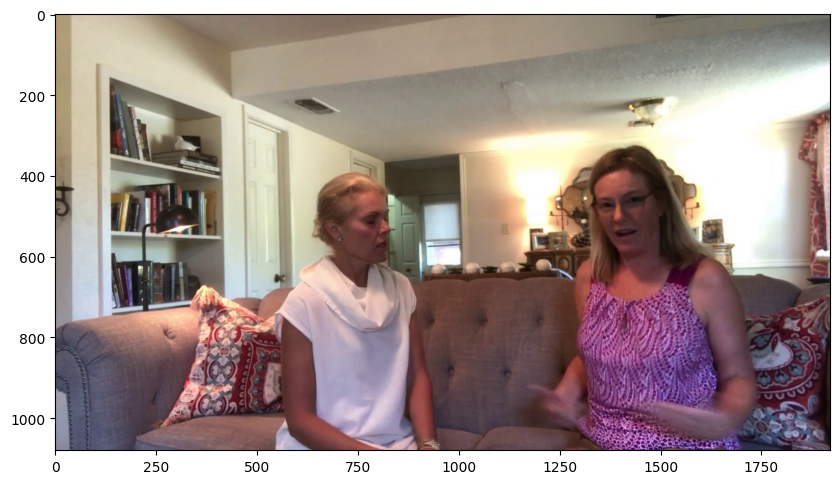

In [8]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])
test_videos.head()
display_image_from_video(os.path.join(DATA_FOLDER, TEST_FOLDER, test_videos.iloc[2].video))


In [ ]:
def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    video_url = open(os.path.join(DATA_FOLDER, subset, video_file), 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

play_video(fake_train_sample_video[0])


In [10]:
pip install opencv-python numpy pandas scikit-learn tensorflow

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [11]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow import keras

# Constants
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 10
MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

# Function to crop center square of a frame
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y:start_y + min_dim, start_x:start_x + min_dim]

# Function to load video frames
def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    frame_count = 0
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]  # Convert BGR to RGB
            frames.append(frame)
            
            frame_count += 1
            if max_frames > 0 and frame_count >= max_frames:
                break
                
    finally:
        cap.release()
    
    return np.array(frames)

# Function to build feature extractor model
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input
    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)
    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

# Function to prepare all videos for training/testing
def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    frame_features = np.zeros((num_samples, MAX_SEQ_LENGTH, NUM_FEATURES))
    frame_masks = np.zeros((num_samples, MAX_SEQ_LENGTH), dtype=bool)
    labels = (df['label'] == 'FAKE').astype(int).values

    feature_extractor = build_feature_extractor()

    for idx, video_path in enumerate(df.index):
        frames = load_video(os.path.join(root_dir, video_path), max_frames=MAX_SEQ_LENGTH)
        frames = frames[None, ...]

        temp_frame_features = np.zeros((1, MAX_SEQ_LENGTH, NUM_FEATURES))
        temp_frame_masks = np.zeros((1, MAX_SEQ_LENGTH), dtype=bool)

        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)

            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
            
            temp_frame_masks[i, :length] = True

        frame_features[idx, ] = temp_frame_features.squeeze()
        frame_masks[idx, ] = temp_frame_masks.squeeze()

    return (frame_features, frame_masks), labels

# Load metadata
DATA_FOLDER = r"C:\Users\saipr\Downloads\deepfake-detection-challenge"
TRAIN_SAMPLE_FOLDER = r"train_sample_videos"

train_sample_metadata = pd.read_json(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, 'metadata.json')).T

# Split data into train and test sets
Train_set, Test_set = train_test_split(train_sample_metadata, test_size=0.1, random_state=42, stratify=train_sample_metadata['label'])

# Prepare train and test data
train_data, train_labels = prepare_all_videos(Train_set, os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER))
test_data, test_labels = prepare_all_videos(Test_set, os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER))

# Define model architecture
frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype=bool)

x = keras.layers.GRU(16, return_sequences=True)(frame_features_input, mask=mask_input)
x = keras.layers.GRU(8)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)

# Compile model
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

# Define model checkpoint
checkpoint = keras.callbacks.ModelCheckpoint('best_model.weights.h5', 
                                             save_weights_only=True, 
                                             save_best_only=True)

# Train the model
history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data=([test_data[0], test_data[1]], test_labels),
    callbacks=[checkpoint],
    epochs=EPOCHS,
    batch_size=8
)

# Save model architecture to JSON file
model_json = model.to_json()
with open("model_architecture.json", "w") as json_file:
    json_file.write(model_json)

# Save training history to a file
np.save('training_history.npy', history.history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 20, 2048)  │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_5       │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 20, 16)    │     99,168 │ input_layer_4[0]… │
│                     │                   │            │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 8)         │        624 │ gru[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 8)         │          0 │ gru_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 8)         │         72 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1)         │          9 │ dense[0][0]       │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 99,873 (390.13 KB)

 Trainable params: 99,873 (390.13 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 14s 70ms/step - accuracy: 0.7088 - loss: 0.5808 - val_accuracy: 0.8000 - val_loss: 0.5009
Epoch 2/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.8054 - loss: 0.5220 - val_accuracy: 0.8000 - val_loss: 0.5008
Epoch 3/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8233 - loss: 0.5305 - val_accuracy: 0.8000 - val_loss: 0.5021
Epoch 4/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8300 - loss: 0.4700 - val_accuracy: 0.8000 - val_loss: 0.5020
Epoch 5/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.8062 - loss: 0.5100 - val_accuracy: 0.8000 - val_loss: 0.4967
Epoch 6/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.7973 - loss: 0.5082 - val_accuracy: 0.8000 - val_loss: 0.4947
Epoch 7/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.8242 - loss: 0.4666 - val_accuracy: 0.8000 - val_loss: 0.4868
Epoch 8/10
45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.8263 - loss: 0.4864 - val_accuracy: 0.8000 - 

In [19]:

pip install opencv-python-headless


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import os
import numpy as np
import cv2
from tensorflow import keras

# Constants and variables
MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048
DATA_FOLDER = r"C:\Users\saipr\Downloads\deepfake-detection-challenge"  # Adjust this path as per your setup
TEST_FOLDER = r"test_videos"  # Adjust this folder name as per your setup
test_videos = {"video": [r"C:\Users\saipr\Downloads\deepfake-detection-challenge\test_videos\zgjosltkie.mp4"]}  # Replace with actual video paths

# Function to load video frames
def load_video(path):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            frames.append(frame)
    finally:
        cap.release()
    return np.array(frames)

# Function to load feature extractor model
def feature_extractor():
    # Load InceptionV3 model pretrained on ImageNet without top layers
    base_model = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(224, 224, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input
    return base_model, preprocess_input

# Function to load classification model architecture from JSON
def load_classification_model_architecture(model_architecture_path):
    # Load model architecture from JSON file
    with open(model_architecture_path, 'r') as json_file:
        loaded_model_json = json_file.read()

    # Create model from loaded architecture
    loaded_model = keras.models.model_from_json(loaded_model_json)

    return loaded_model

# Function to load weights into the classification model
def load_classification_model_weights(model, model_weights_path):
    # Load weights into the model
    model.load_weights(model_weights_path)

    return model

# Function for sequence prediction
def sequence_prediction(video_path, feature_extractor_model, classification_model):
    # Load video frames
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER, video_path))

    # Prepare frames for prediction
    frame_features, frame_mask = prepare_single_video(frames, feature_extractor_model)

    # Perform prediction using the loaded model
    prediction = classification_model.predict([frame_features, frame_mask])[0]

    return prediction

# Function to prepare a single video for prediction
def prepare_single_video(frames, feature_extractor_model):
    # Initialize arrays for frame features and masks
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype=float)
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH), dtype=bool)

    # Process each frame
    for i in range(min(MAX_SEQ_LENGTH, len(frames))):
        # Preprocess frame
        frame = cv2.resize(frames[i], (224, 224))  # Resize frame for InceptionV3 input
        frame = preprocess_input(frame)
        frame = np.expand_dims(frame, axis=0)

        # Extract features using InceptionV3
        frame_features[0, i, :] = feature_extractor_model.predict(frame)
        frame_mask[0, i] = True

    return frame_features, frame_mask

# Function to play video
import subprocess

def play_video(video_path, folder):
    video_full_path = os.path.join(DATA_FOLDER, folder, video_path)
    
    try:
        subprocess.Popen(['xdg-open', video_full_path])  # For Linux
    except OSError:
        try:
            subprocess.Popen(['open', video_full_path])  # For macOS
        except OSError:
            print('Failed to open video. Please open it manually:', video_full_path)


# Main script
if __name__ == "__main__":
    # Load feature extractor model
    feature_extractor_model, preprocess_input = feature_extractor()

    # Load classification model architecture
    classification_model_architecture_path = r"C:\Users\saipr\Downloads\model_architecture.json"
    try:
        classification_model = load_classification_model_architecture(classification_model_architecture_path)
    except (OSError, IOError) as e:
        print(f"Error loading classification model architecture: {e}")
        exit()  # Exit if model loading fails

    # Load weights into classification model
    classification_weights_path = r"C:\Users\saipr\Downloads\best_model.weights.h5"
    try:
        classification_model = load_classification_model_weights(classification_model, classification_weights_path)
    except (OSError, IOError) as e:
        print(f"Error loading classification model weights: {e}")
        exit()  # Exit if weights loading fails

    # Choose a random test video
    test_video = np.random.choice(test_videos["video"])

    print(f"Test video path: {test_video}")

    # Perform prediction
    try:
        prediction = sequence_prediction(test_video, feature_extractor_model, classification_model)
    except Exception as e:  # Catch general exceptions for unexpected issues
        print(f"Error during prediction: {e}")
    else:
        # Display prediction result based on your model's output format (e.g., probability threshold)
        if prediction >= 0.5:
            print('The predicted class of the video is FAKE')
        else:
            print('The predicted class of the video is REAL')

    # Play the video (optional)
    play_video(test_video, TEST_FOLDER)


Test video path: C:\Users\saipr\Downloads\deepfake-detection-challenge\test_videos\zgjosltkie.mp4
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
The predicted class of the video is FAKE
Failed to open video. Please open it manually: C:\Users\sa